# Regression Analysis for Spotify Dataset

### Question: How is popularity rating determined? What affects a song's popularity?

Import important libraries for regression model

In [ ]:
import numpy as np
import pandas as pd
from matplotlib.pyplot import subplots 
import statsmodels.api as sm
from ISLP import load_data
from ISLP.models import (ModelSpec as MS,
summarize)
from ISLP import confusion_table
from ISLP.models import contrast
from sklearn.discriminant_analysis import (LinearDiscriminantAnalysis as LDA, 
                                           QuadraticDiscriminantAnalysis as QDA)
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier 
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.ensemble import RandomForestRegressor
import sys
print(sys.version)
sys.executable
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

pd.set_option('display.max_columns', None)

3.11.5 | packaged by Anaconda, Inc. | (main, Sep 11 2023, 13:26:23) [MSC v.1916 64 bit (AMD64)]


Import the spotify songs dataset and view different predictors

In [ ]:
spotify = pd.read_csv("spotify_songs.csv") 
spotify.head()

,track_id,track_name,track_artist,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,playlist_genre,playlist_subgenre,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms
0,6f807x0ima9a1j3VPbc7VN,I Don't Care (with Justin Bieber) - Loud Luxur...,Ed Sheeran,66,2oCs0DGTsRO98Gh5ZSl2Cx,I Don't Care (with Justin Bieber) [Loud Luxury...,2019-06-14,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.748,0.916,6,-2.634,1,0.0583,0.1020,0.000000,0.0653,0.518,122.036,194754
1,0r7CVbZTWZgbTCYdfa2P31,Memories - Dillon Francis Remix,Maroon 5,67,63rPSO264uRjW1X5E6cWv6,Memories (Dillon Francis Remix),2019-12-13,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.726,0.815,11,-4.969,1,0.0373,0.0724,0.004210,0.3570,0.693,99.972,162600
2,1z1Hg7Vb0AhHDiEmnDE79l,All the Time - Don Diablo Remix,Zara Larsson,70,1HoSmj2eLcsrR0vE9gThr4,All the Time (Don Diablo Remix),2019-07-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.675,0.931,1,-3.432,0,0.0742,0.0794,0.000023,0.1100,0.613,124.008,176616
3,75FpbthrwQmzHlBJLuGdC7,Call You Mine - Keanu Silva Remix,The Chainsmokers,60,1nqYsOef1yKKuGOVchbsk6,Call You Mine - The Remixes,2019-07-19,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.718,0.930,7,-3.778,1,0.1020,0.0287,0.000009,0.2040,0.277,121.956,169093
4,1e8PAfcKUYoKkxPhrHqw4x,Someone You Loved - Future Humans Remix,Lewis Capaldi,69,7m7vv9wlQ4i0LFuJiE2zsQ,Someone You Loved (Future Humans Remix),2019-03-05,Pop Remix,37i9dQZF1DXcZDD7cfEKhW,pop,dance pop,0.650,0.833,1,-4.672,1,0.0359,0.0803,0.000000,0.0833,0.725,123.976,189052


Ensure that there are no null values within the spotify dataset

In [ ]:
# drop na values in the spotify dataset
spotify = spotify.dropna()

In [ ]:
# view columns in the dataset
spotify.columns

Index(['track_id', 'track_name', 'track_artist', 'track_popularity',
       'track_album_id', 'track_album_name', 'track_album_release_date',
       'playlist_name', 'playlist_id', 'playlist_genre', 'playlist_subgenre',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_ms'],
      dtype='object')

In [ ]:
spotify.dtypes  

track_id                     object
track_name                   object
track_artist                 object
track_popularity              int64
track_album_id               object
track_album_name             object
track_album_release_date     object
playlist_name                object
playlist_id                  object
playlist_genre               object
playlist_subgenre            object
danceability                float64
energy                      float64
key                           int64
loudness                    float64
mode                          int64
speechiness                 float64
acousticness                float64
instrumentalness            float64
liveness                    float64
valence                     float64
tempo                       float64
duration_ms                   int64
dtype: object

For EDA visualization, we can consider track popularity and its relationship to all predictors.

In [ ]:
# Create an updated dataframe with only the columns we want to use: "playlist_genre", "danceability", "energy", "loudness", "speechiness", "acousticness", "instrumentalness", "liveness", "valence", "tempo", "duration_ms", "popularity"
spotify = spotify[["playlist_genre", "danceability", "energy", "loudness", "speechiness", "acousticness", "instrumentalness", "liveness", "valence", "tempo", "mode", "key", "duration_ms", "track_popularity"]]
spotify.head()

,playlist_genre,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,mode,key,duration_ms,track_popularity
0,pop,0.748,0.916,-2.634,0.0583,0.1020,0.000000,0.0653,0.518,122.036,1,6,194754,66
1,pop,0.726,0.815,-4.969,0.0373,0.0724,0.004210,0.3570,0.693,99.972,1,11,162600,67
2,pop,0.675,0.931,-3.432,0.0742,0.0794,0.000023,0.1100,0.613,124.008,0,1,176616,70
3,pop,0.718,0.930,-3.778,0.1020,0.0287,0.000009,0.2040,0.277,121.956,1,7,169093,60
4,pop,0.650,0.833,-4.672,0.0359,0.0803,0.000000,0.0833,0.725,123.976,1,1,189052,69


In [ ]:
spotify.select_dtypes(['float', 'int']).describe()

,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,mode,key,duration_ms,track_popularity
count,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000,32828.000000
mean,0.654850,0.698603,-6.719529,0.107053,0.175352,0.084760,0.190175,0.510556,120.883642,0.565737,5.373949,225796.829779,42.483551
std,0.145092,0.180916,2.988641,0.101307,0.219644,0.224245,0.154313,0.233152,26.903632,0.495667,3.611572,59836.492346,24.980476
min,0.000000,0.000175,-46.448000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4000.000000,0.000000
25%,0.563000,0.581000,-8.171250,0.041000,0.015100,0.000000,0.092700,0.331000,99.961000,0.000000,2.000000,187804.500000,24.000000
50%,0.672000,0.721000,-6.166000,0.062500,0.080400,0.000016,0.127000,0.512000,121.984000,1.000000,6.000000,216000.000000,45.000000
75%,0.761000,0.840000,-4.645000,0.132000,0.255000,0.004830,0.248000,0.693000,133.918250,1.000000,9.000000,253581.250000,62.000000
max,0.983000,1.000000,1.275000,0.918000,0.994000,0.994000,0.996000,0.991000,239.440000,1.000000,11.000000,517810.000000,100.000000


C:\Users\18123\AppData\Local\Temp\ipykernel_25604\3221399504.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(y)
c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na

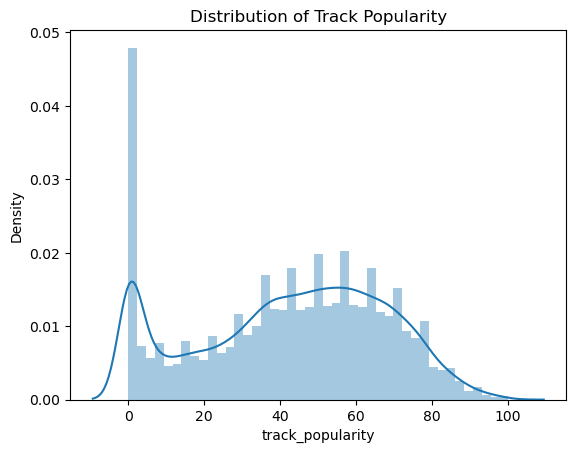

In [ ]:
# set track_popularity as the target variable
y = spotify["track_popularity"]

# set the rest of the variables as the features
X = spotify.drop(columns=["track_popularity"])

# distribution plot of track_popularity
sns.distplot(y)
plt.title('Distribution of Track Popularity')

plt.show()

c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, Categorica

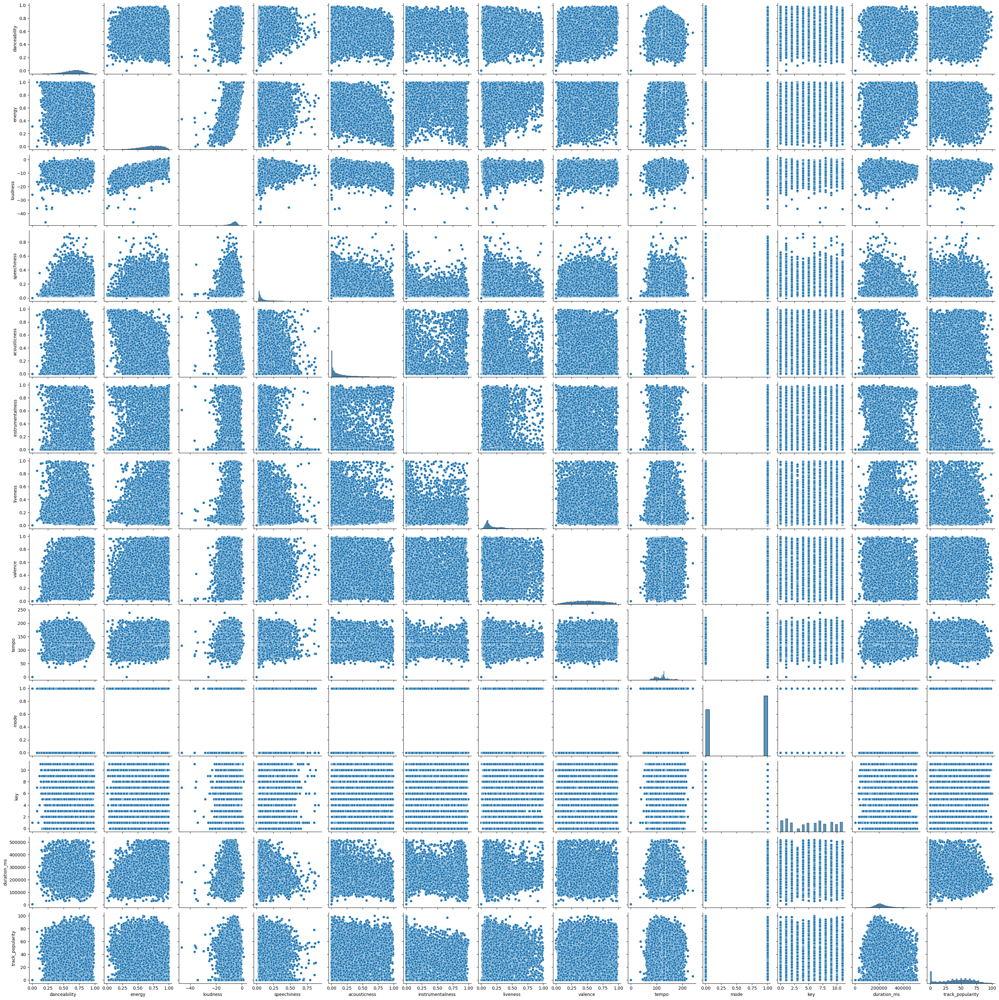

In [ ]:
# pairplot of all variables
sns.pairplot(spotify)

c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, Categorica

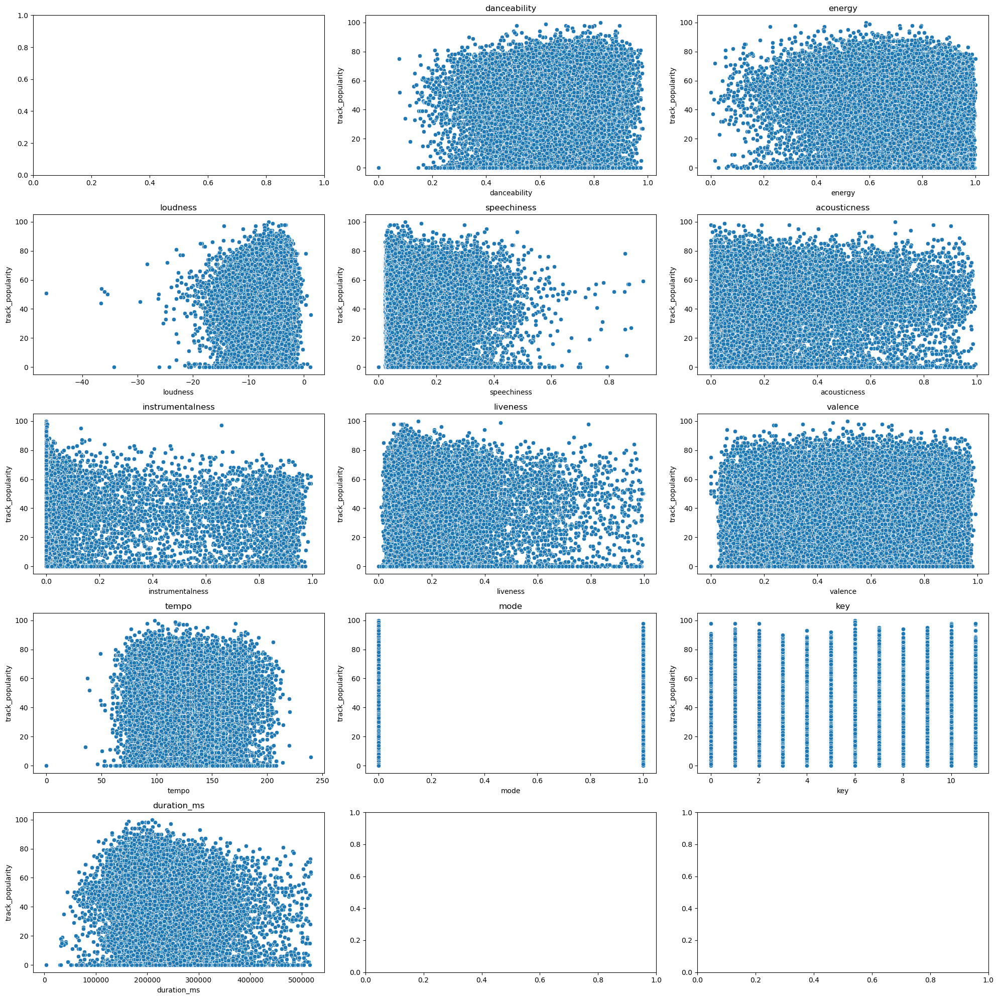

In [ ]:
# Plot scatterplots for all X and y relationships, with each plot a subplot
fig, axes = plt.subplots(5, 3, figsize=(20, 20))
axes = axes.flatten()
for i in range(1, len(X.columns)):
    sns.scatterplot(x=X.iloc[:,i], y=y, ax=axes[i])
    axes[i].set_title(X.columns[i])
plt.tight_layout()
plt.show()



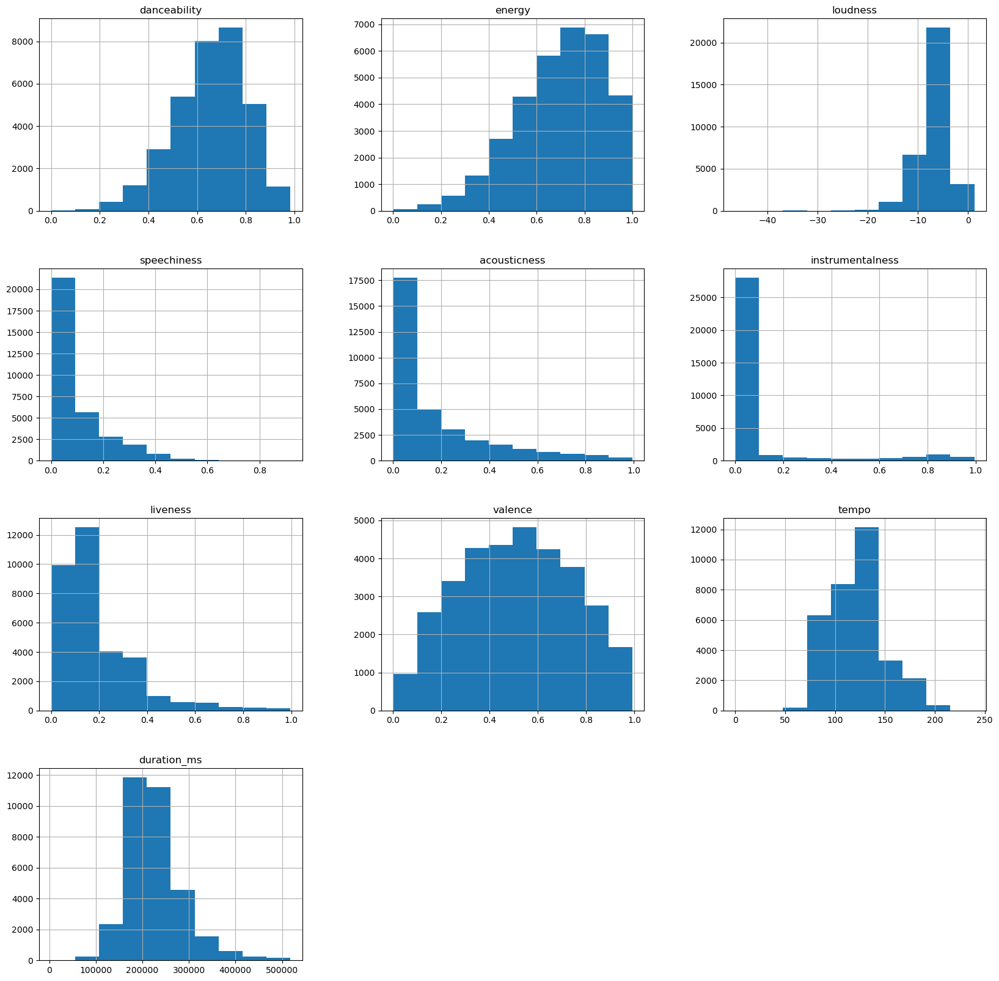

In [ ]:
# Create a data frame without the categorical variables
spotify_no_cat = spotify.drop(columns=["playlist_genre", "mode", "key"])
# Display the column names
spotify_no_cat.columns

# Set the target variable as track_popularity
y_no_cat = spotify_no_cat["track_popularity"]

# Set the features as the remaining columns
X_no_cat = spotify_no_cat.drop(columns=["track_popularity"])

# Histogram for all features X_no_cat
X_no_cat.hist(figsize=(20,20))
plt.show()

In [ ]:
# Split the data into training and test sets with an 80/20 split
train, test = train_test_split(spotify, test_size=0.2, random_state=42)

                            OLS Regression Results                            
Dep. Variable:       track_popularity   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     111.7
Date:                Tue, 12 Dec 2023   Prob (F-statistic):           4.61e-26
Time:                        17:12:05   Log-Likelihood:            -1.2177e+05
No. Observations:               26262   AIC:                         2.436e+05
Df Residuals:                   26260   BIC:                         2.436e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept       35.2001      0.712     49.470   

c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


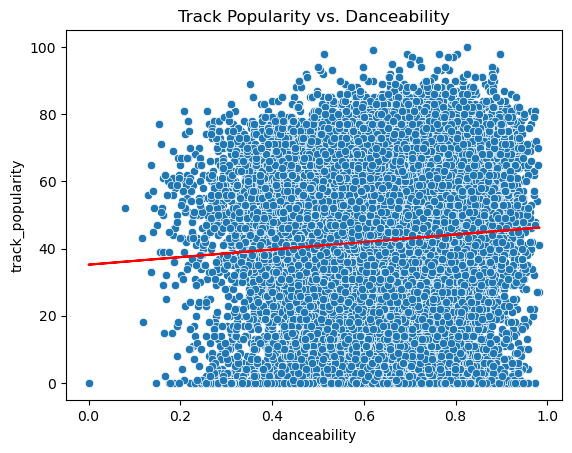

In [ ]:
# Fit a simple linear regression model to predict track_popularity using danceability
model = sm.OLS.from_formula("track_popularity ~ danceability", data=train)
result = model.fit()
print(result.summary())

# Using abline, plot the regression line on a scatterplot of track_popularity and danceability
sns.scatterplot(x=train["danceability"], y=train["track_popularity"])
plt.plot(train["danceability"], result.predict(train["danceability"]), color="red")
plt.title("Track Popularity vs. Danceability")
plt.show()

                            OLS Regression Results                            
Dep. Variable:       track_popularity   R-squared:                       0.013
Model:                            OLS   Adj. R-squared:                  0.013
Method:                 Least Squares   F-statistic:                     347.1
Date:                Tue, 12 Dec 2023   Prob (F-statistic):           5.66e-77
Time:                        17:12:30   Log-Likelihood:            -1.2166e+05
No. Observations:               26262   AIC:                         2.433e+05
Df Residuals:                   26260   BIC:                         2.433e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     53.5909      0.613     87.491      0.0

c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


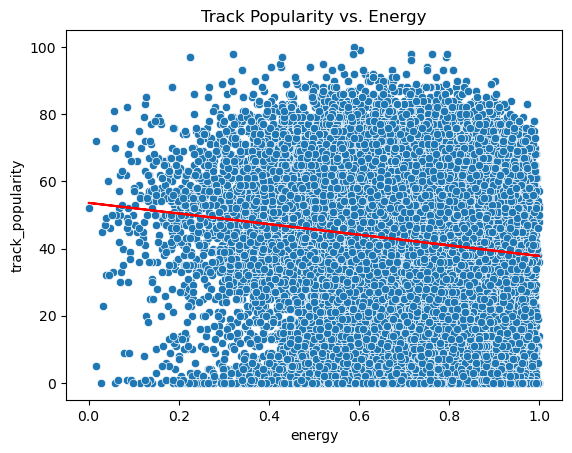

In [ ]:
# FIt a simple linear regression model to predict track_popularity using energy
model = sm.OLS.from_formula("track_popularity ~ energy", data=train)
result = model.fit()
print(result.summary())

# Using abline, plot the regression line on a scatterplot of track_popularity and energy
sns.scatterplot(x=train["energy"], y=train["track_popularity"])
plt.plot(train["energy"], result.predict(train["energy"]), color="red")
plt.title("Track Popularity vs. Energy")
plt.show()

                            OLS Regression Results                            
Dep. Variable:       track_popularity   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     82.24
Date:                Tue, 12 Dec 2023   Prob (F-statistic):           1.29e-19
Time:                        17:12:45   Log-Likelihood:            -1.2179e+05
No. Observations:               26262   AIC:                         2.436e+05
Df Residuals:                   26260   BIC:                         2.436e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     45.6857      0.379    120.439      0.0

c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


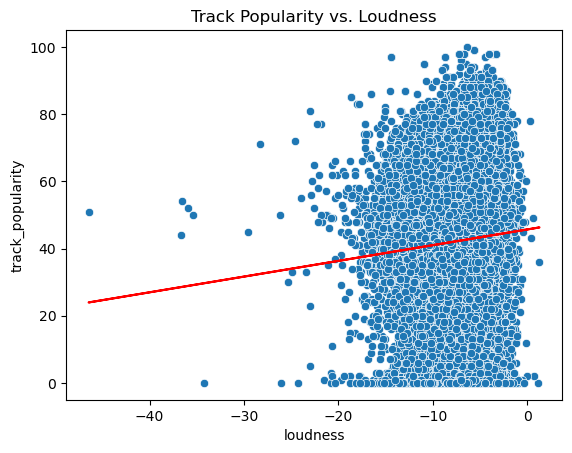

In [ ]:
# Fit a simple linear regression model to predict track_popularity using loudness
model = sm.OLS.from_formula("track_popularity ~ loudness", data=train)
result = model.fit()
print(result.summary())

# Using abline, plot the regression line on a scatterplot of track_popularity and loudness
sns.scatterplot(x=train["loudness"], y=train["track_popularity"])
plt.plot(train["loudness"], result.predict(train["loudness"]), color="red")
plt.title("Track Popularity vs. Loudness")
plt.show()

                            OLS Regression Results                            
Dep. Variable:       track_popularity   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.7030
Date:                Tue, 12 Dec 2023   Prob (F-statistic):              0.402
Time:                        17:13:06   Log-Likelihood:            -1.2183e+05
No. Observations:               26262   AIC:                         2.437e+05
Df Residuals:                   26260   BIC:                         2.437e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      42.4060      0.225    188.736      

c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


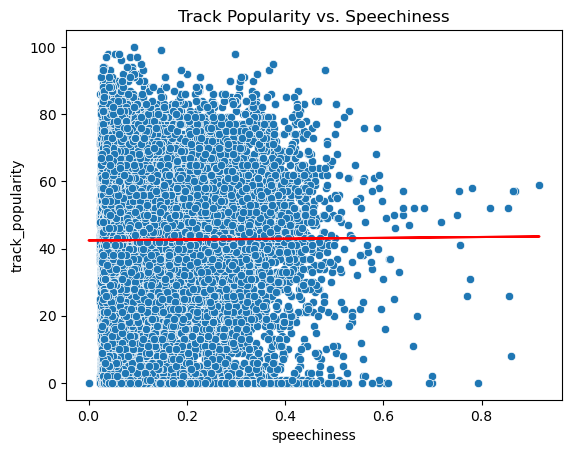

In [ ]:
# Fit a simple linear regression model to predict track_popularity using speechiness
model = sm.OLS.from_formula("track_popularity ~ speechiness", data=train)
result = model.fit()
print(result.summary())

# Using abline, plot the regression line on a scatterplot of track_popularity and speechiness
sns.scatterplot(x=train["speechiness"], y=train["track_popularity"])
plt.plot(train["speechiness"], result.predict(train["speechiness"]), color="red")
plt.title("Track Popularity vs. Speechiness")
plt.show()

                            OLS Regression Results                            
Dep. Variable:       track_popularity   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     210.8
Date:                Tue, 12 Dec 2023   Prob (F-statistic):           1.38e-47
Time:                        17:13:23   Log-Likelihood:            -1.2173e+05
No. Observations:               26262   AIC:                         2.435e+05
Df Residuals:                   26260   BIC:                         2.435e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept       40.7591      0.197    207.034   

c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


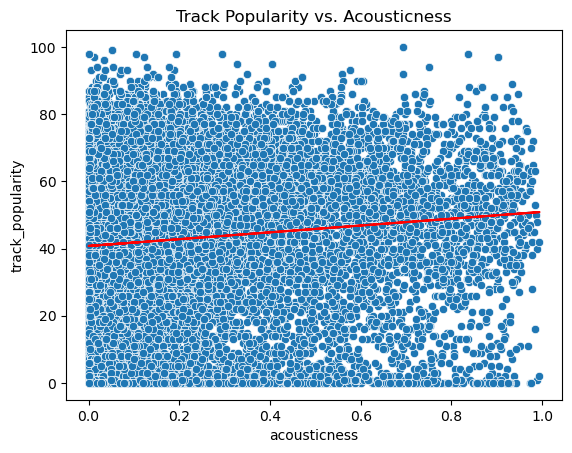

In [ ]:
# Fit a simple linear regression model to predict track_popularity using acousticness
model = sm.OLS.from_formula("track_popularity ~ acousticness", data=train)
result = model.fit()
print(result.summary())

# Using abline, plot the regression line on a scatterplot of track_popularity and acousticness
sns.scatterplot(x=train["acousticness"], y=train["track_popularity"])
plt.plot(train["acousticness"], result.predict(train["acousticness"]), color="red")
plt.title("Track Popularity vs. Acousticness")
plt.show()

In [ ]:
# Fit a simple linear regression model to predict track_popularity using instrumentalness
model = sm.OLS.from_formula("track_popularity ~ instrumentalness", data=train)
result = model.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:       track_popularity   R-squared:                       0.022
Model:                            OLS   Adj. R-squared:                  0.022
Method:                 Least Squares   F-statistic:                     593.6
Date:                Tue, 12 Dec 2023   Prob (F-statistic):          1.15e-129
Time:                        17:04:07   Log-Likelihood:            -1.2154e+05
No. Observations:               26262   AIC:                         2.431e+05
Df Residuals:                   26260   BIC:                         2.431e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept           43.9402      0.163  

                            OLS Regression Results                            
Dep. Variable:       track_popularity   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     76.45
Date:                Tue, 12 Dec 2023   Prob (F-statistic):           2.39e-18
Time:                        17:13:44   Log-Likelihood:            -1.2179e+05
No. Observations:               26262   AIC:                         2.436e+05
Df Residuals:                   26260   BIC:                         2.436e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     44.2071      0.245    180.444      0.0

c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


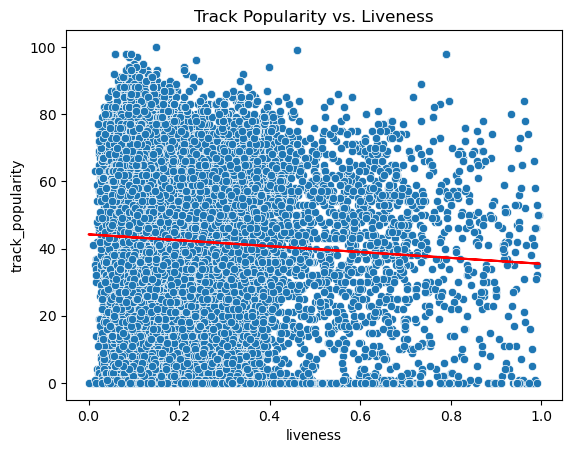

In [ ]:
# Fit a simple linear regression model to predict track_popularity using liveness
model = sm.OLS.from_formula("track_popularity ~ liveness", data=train)
result = model.fit()
print(result.summary())

# Using abline, plot the regression line on a scatterplot of track_popularity and liveness
sns.scatterplot(x=train["liveness"], y=train["track_popularity"])
plt.plot(train["liveness"], result.predict(train["liveness"]), color="red")
plt.title("Track Popularity vs. Liveness")
plt.show()

                            OLS Regression Results                            
Dep. Variable:       track_popularity   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     25.49
Date:                Tue, 12 Dec 2023   Prob (F-statistic):           4.48e-07
Time:                        17:13:57   Log-Likelihood:            -1.2182e+05
No. Observations:               26262   AIC:                         2.436e+05
Df Residuals:                   26260   BIC:                         2.437e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     40.8322      0.372    109.660      0.0

c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


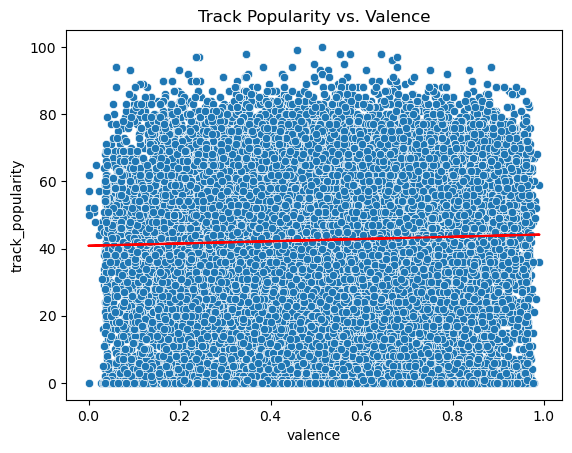

In [ ]:
# Fit a simple linear regression model to predict track_popularity using valence
model = sm.OLS.from_formula("track_popularity ~ valence", data=train)
result = model.fit()
print(result.summary())

# Using abline, plot the regression line on a scatterplot of track_popularity and valence
sns.scatterplot(x=train["valence"], y=train["track_popularity"])
plt.plot(train["valence"], result.predict(train["valence"]), color="red")
plt.title("Track Popularity vs. Valence")
plt.show()

                            OLS Regression Results                            
Dep. Variable:       track_popularity   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.604
Date:                Tue, 12 Dec 2023   Prob (F-statistic):              0.205
Time:                        17:14:11   Log-Likelihood:            -1.2183e+05
No. Observations:               26262   AIC:                         2.437e+05
Df Residuals:                   26260   BIC:                         2.437e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     43.4217      0.711     61.079      0.0

c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


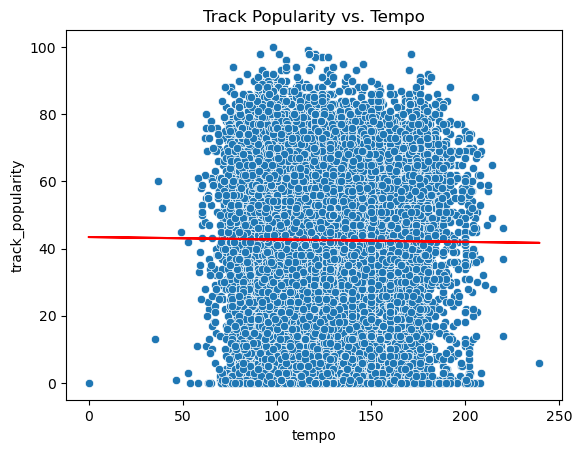

In [ ]:
# Fit a simple linear regression model to predict track_popularity using tempo
model = sm.OLS.from_formula("track_popularity ~ tempo", data=train)
result = model.fit()
print(result.summary())

# Using abline, plot the regression line on a scatterplot of track_popularity and tempo
sns.scatterplot(x=train["tempo"], y=train["track_popularity"])
plt.plot(train["tempo"], result.predict(train["tempo"]), color="red")
plt.title("Track Popularity vs. Tempo")
plt.show()

                            OLS Regression Results                            
Dep. Variable:       track_popularity   R-squared:                       0.020
Model:                            OLS   Adj. R-squared:                  0.020
Method:                 Least Squares   F-statistic:                     544.3
Date:                Tue, 12 Dec 2023   Prob (F-statistic):          3.60e-119
Time:                        17:14:25   Log-Likelihood:            -1.2156e+05
No. Observations:               26262   AIC:                         2.431e+05
Df Residuals:                   26260   BIC:                         2.431e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept      55.9899      0.596     93.892      

c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


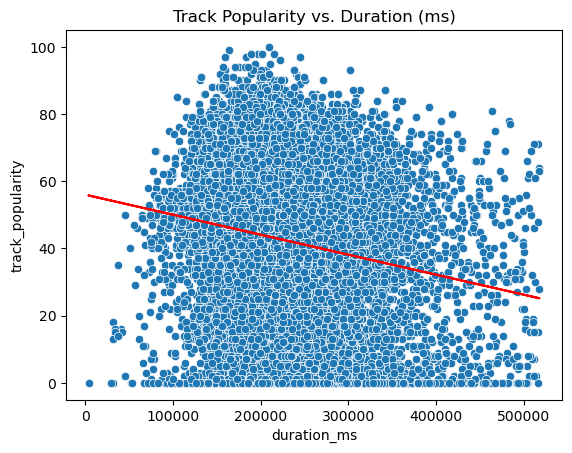

In [ ]:
# Fit a simple linear regression model to predict track_popularity using duration_ms
model = sm.OLS.from_formula("track_popularity ~ duration_ms", data=train)
result = model.fit()
print(result.summary())

# Using abline, plot the regression line on a scatterplot of track_popularity and duration_ms
sns.scatterplot(x=train["duration_ms"], y=train["track_popularity"])
plt.plot(train["duration_ms"], result.predict(train["duration_ms"]), color="red")
plt.title("Track Popularity vs. Duration (ms)")
plt.show()

                            OLS Regression Results                            
Dep. Variable:       track_popularity   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     5.433
Date:                Tue, 12 Dec 2023   Prob (F-statistic):             0.0198
Time:                        17:14:46   Log-Likelihood:            -1.2183e+05
No. Observations:               26262   AIC:                         2.437e+05
Df Residuals:                   26260   BIC:                         2.437e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     42.1347      0.233    180.468      0.0

c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


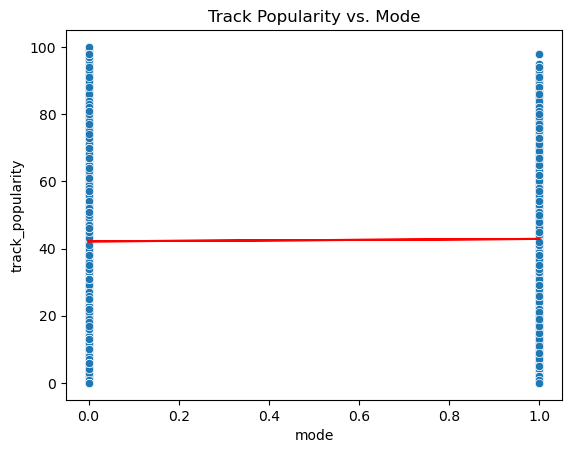

In [ ]:
# Fit a simple linear regression model to predict track_popularity using mode
model = sm.OLS.from_formula("track_popularity ~ mode", data=train)
result = model.fit()
print(result.summary())

# Using abline, plot the regression line on a scatterplot of track_popularity and mode
sns.scatterplot(x=train["mode"], y=train["track_popularity"])
plt.plot(train["mode"], result.predict(train["mode"]), color="red")
plt.title("Track Popularity vs. Mode")
plt.show()

                            OLS Regression Results                            
Dep. Variable:       track_popularity   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.4823
Date:                Tue, 12 Dec 2023   Prob (F-statistic):              0.487
Time:                        17:15:13   Log-Likelihood:            -1.2183e+05
No. Observations:               26262   AIC:                         2.437e+05
Df Residuals:                   26260   BIC:                         2.437e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     42.7023      0.277    154.304      0.0

c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


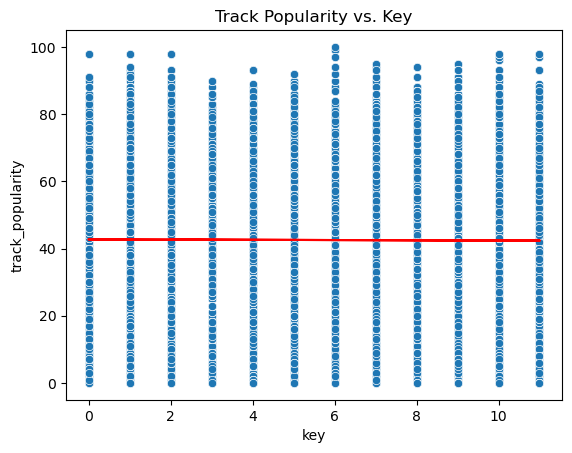

In [ ]:
# Fit a simple linear regression model to predict track_popularity using key
model = sm.OLS.from_formula("track_popularity ~ key", data=train)
result = model.fit()
print(result.summary())

# Using abline, plot the regression line on a scatterplot of track_popularity and key
sns.scatterplot(x=train["key"], y=train["track_popularity"])
plt.plot(train["key"], result.predict(train["key"]), color="red")
plt.title("Track Popularity vs. Key")
plt.show()

In [ ]:
# Fit a simple linear regression model to predict track_popularity using all features
model = sm.OLS.from_formula("track_popularity ~ danceability + energy + loudness + speechiness + acousticness + instrumentalness + liveness + valence + tempo + duration_ms + mode + key", data=train)
result = model.fit()
print(result.summary())

                            OLS Regression Results                            
Dep. Variable:       track_popularity   R-squared:                       0.074
Model:                            OLS   Adj. R-squared:                  0.073
Method:                 Least Squares   F-statistic:                     174.1
Date:                Tue, 12 Dec 2023   Prob (F-statistic):               0.00
Time:                        17:15:42   Log-Likelihood:            -1.2082e+05
No. Observations:               26262   AIC:                         2.417e+05
Df Residuals:                   26249   BIC:                         2.418e+05
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept           78.9437      1.878  

In [ ]:
# Using the no_cat dataframe, check the correlation between all variables and track_popularity in ascending order
spotify_no_cat.corr()["track_popularity"].sort_values(ascending=False)

track_popularity    1.000000
acousticness        0.085042
danceability        0.064754
loudness            0.057717
valence             0.033278
speechiness         0.007067
tempo              -0.005538
liveness           -0.054593
energy             -0.108984
duration_ms        -0.143634
instrumentalness   -0.150003
Name: track_popularity, dtype: float64

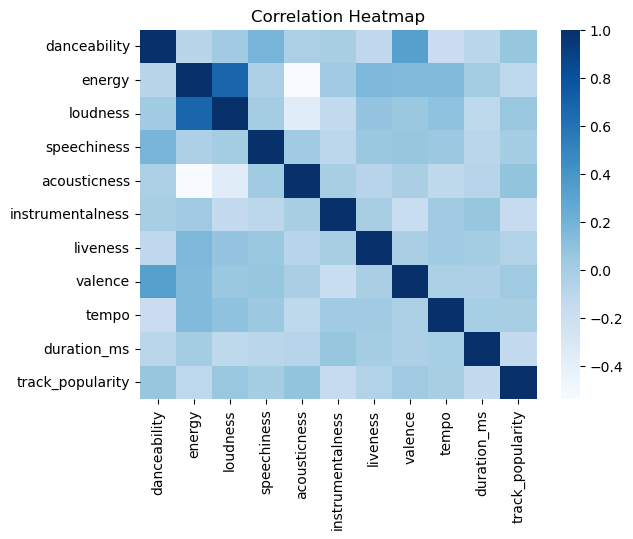

In [ ]:
# Plot a correlation heatmap of the no_cat dataframe
sns.heatmap(spotify_no_cat.corr(), cmap="Blues")
plt.title("Correlation Heatmap")
plt.show()

#### Model 1: Linear Regression Using Top Correlated Value

In [ ]:
# Set target variable as track_popularity and features as the remaining columns
target = spotify_no_cat["track_popularity"]
features = spotify_no_cat.drop(columns=["track_popularity"])

# Split the data into training and test sets with an 80/20 split
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Scale the training and test data
scaler = StandardScaler()
scaler.fit_transform(X_train)
X_train_scaled = pd.DataFrame(data = scaler.transform(X_train), columns=features.columns)
X_test_scaled = pd.DataFrame(data = scaler.transform(X_test), columns=features.columns)



Training MSE: 621.5256167299825
Test MSE: 611.4299423879226
Training RMSE: 24.930415494531626
Test RMSE: 24.727109462853164
R-squared: 0.004013145697464582


c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


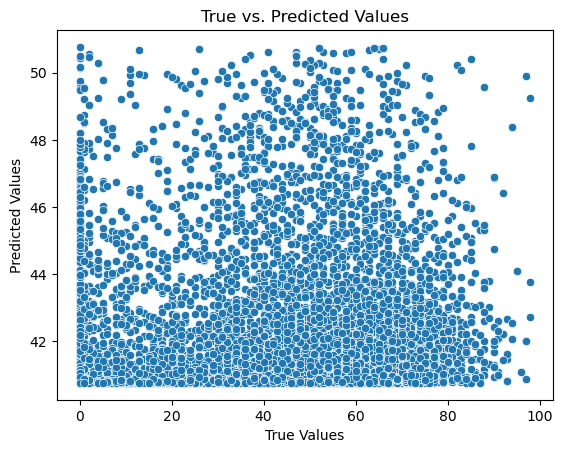

In [ ]:
# Fit a linear regression model to predict track_popularity using acousticness
lm_one = LinearRegression()
lm_one = lm_one.fit(X_train_scaled[["acousticness"]], y_train)

# Calculate predictions for training and test sets
train_preds_one = lm_one.predict(X_train_scaled[["acousticness"]])
test_preds_one = lm_one.predict(X_test_scaled[["acousticness"]])

# Calculate training and test MSE
train_mse_one = np.mean((y_train - train_preds_one)**2)
test_mse_one = np.mean((y_test - test_preds_one)**2)

# Print training and test MSE
print("Training MSE:", train_mse_one)
print("Test MSE:", test_mse_one)

# Calculate training and test RMSE
train_rmse_one = np.sqrt(train_mse_one)
test_rmse_one = np.sqrt(test_mse_one)

# Print training and test RMSE
print("Training RMSE:", train_rmse_one)
print("Test RMSE:", test_rmse_one)

# Print R-squared
print("R-squared:", lm_one.score(X_test_scaled[["acousticness"]], y_test))

# Plot a scatterplot of the true values vs. the predicted values for the test set
sns.scatterplot(x=y_test, y=test_preds_one)
plt.xlabel("True Values")
plt.ylabel("Predicted Values")
plt.title("True vs. Predicted Values")
plt.show()


#### Model 2: Mulitple Linear Regression

Training MSE: 580.5029849940854
Test MSE: 573.7264040784189
Training RMSE: 24.093629552105373
Test RMSE: 23.952586584300636
R-squared: 0.06543020415930323


c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


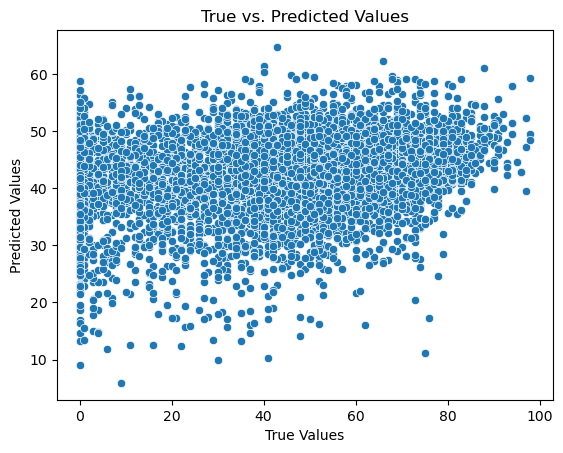

In [ ]:
# Fit a linear regression model to predict track_popularity using all features
lm_two = LinearRegression()
lm_two = lm_two.fit(X_train_scaled, y_train)

# Calculate predictions for training and test sets
train_preds_two = lm_two.predict(X_train_scaled)
test_preds_two = lm_two.predict(X_test_scaled)

# Calculate training and test MSE
train_mse_two = np.mean((y_train - train_preds_two)**2)
test_mse_two = np.mean((y_test - test_preds_two)**2)

# Print training and test MSE
print("Training MSE:", train_mse_two)
print("Test MSE:", test_mse_two)

# Calculate training and test RMSE
train_rmse_two = np.sqrt(train_mse_two)
test_rmse_two = np.sqrt(test_mse_two)

# Print training and test RMSE
print("Training RMSE:", train_rmse_two)
print("Test RMSE:", test_rmse_two)

# Print R-squared
print("R-squared:", lm_two.score(X_test_scaled, y_test))

# Plot a scatterplot of the true values vs. the predicted values for the test set
sns.scatterplot(x=y_test, y=test_preds_two)
plt.xlabel("True Values")
plt.ylabel("Predicted Values")
plt.title("True vs. Predicted Values")
plt.show()

#### Model 3: Lasso Method

Training MSE: 589.665200214205
Test MSE: 579.5210762365979
Training RMSE: 24.283022880485966
Test RMSE: 24.07324399071712
R-squared: 0.055990991431187465


c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
c:\Users\18123\anaconda3\envs\islp\Lib\site-packages\seaborn\_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


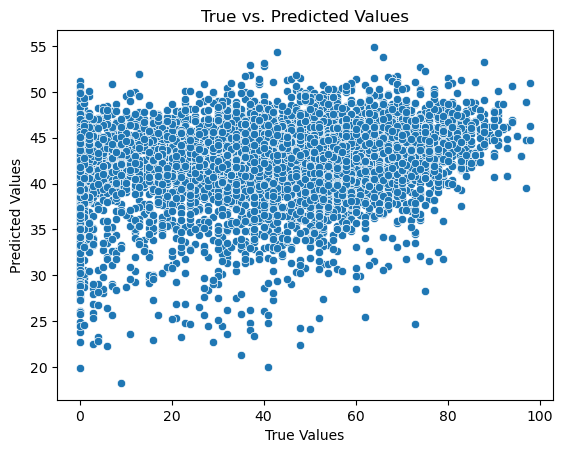

In [ ]:
# Use the lasso regression model to predict track_popularity using all features
lm_three = Lasso()
lm_three = lm_three.fit(X_train_scaled, y_train)

# Calculate predictions for training and test sets
train_preds_three = lm_three.predict(X_train_scaled)
test_preds_three = lm_three.predict(X_test_scaled)

# Calculate training and test MSE
train_mse_three = np.mean((y_train - train_preds_three)**2)
test_mse_three = np.mean((y_test - test_preds_three)**2)

# Print training and test MSE
print("Training MSE:", train_mse_three)
print("Test MSE:", test_mse_three)

# Calculate training and test RMSE
train_rmse_three = np.sqrt(train_mse_three)
test_rmse_three = np.sqrt(test_mse_three)

# Print training and test RMSE
print("Training RMSE:", train_rmse_three)
print("Test RMSE:", test_rmse_three)

# Print R-squared
print("R-squared:", lm_three.score(X_test_scaled, y_test))

# Plot a scatterplot of the true values vs. the predicted values for the test set
sns.scatterplot(x=y_test, y=test_preds_three)
plt.xlabel("True Values")
plt.ylabel("Predicted Values")
plt.title("True vs. Predicted Values")
plt.show()

#### Model 4: Random Forest Regression

In [ ]:
# Fit a random forest regression model to predict track_popularity using all features
rf = RandomForestRegressor()
rf = rf.fit(X_train_scaled, y_train)

# Print the model score for the training set
print("Training Score:", rf.score(X_train_scaled, y_train))

# Make predictions on the test set
test_preds_four = rf.predict(X_test_scaled)

# Print the model score for the test set
print("Test Score:", rf.score(X_test_scaled, y_test))

Training Score: 0.8810770266614566
Test Score: 0.27360637437314195
